In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pickle
from pandas_profiling import ProfileReport

In [2]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge,RidgeCV,Lasso,LassoCV,ElasticNet,ElasticNetCV,LogisticRegression
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import accuracy_score,confusion_matrix,roc_curve,roc_auc_score
#import scikitplot as skl

In [3]:
df = pd.read_csv("diabetes.csv")

In [4]:
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [5]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [ ]:
ProfileReport(df)

In [7]:
# instead of removing the features we are replacing the zero values with mean value
df['BMI'] = df['BMI'].replace(0,df['BMI'].mean())

In [8]:
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [9]:
df['BloodPressure'] = df['BloodPressure'].replace(0,df['BloodPressure'].mean())

In [10]:
df['Insulin'] = df['Insulin'].replace(0,df['Insulin'].mean())

In [11]:
df['Glucose'] = df['Glucose'].replace(0,df['Glucose'].mean())

In [12]:
df['SkinThickness'] = df['SkinThickness'].replace(0,df['SkinThickness'].mean())

In [ ]:
ProfileReport(df)

<AxesSubplot:>

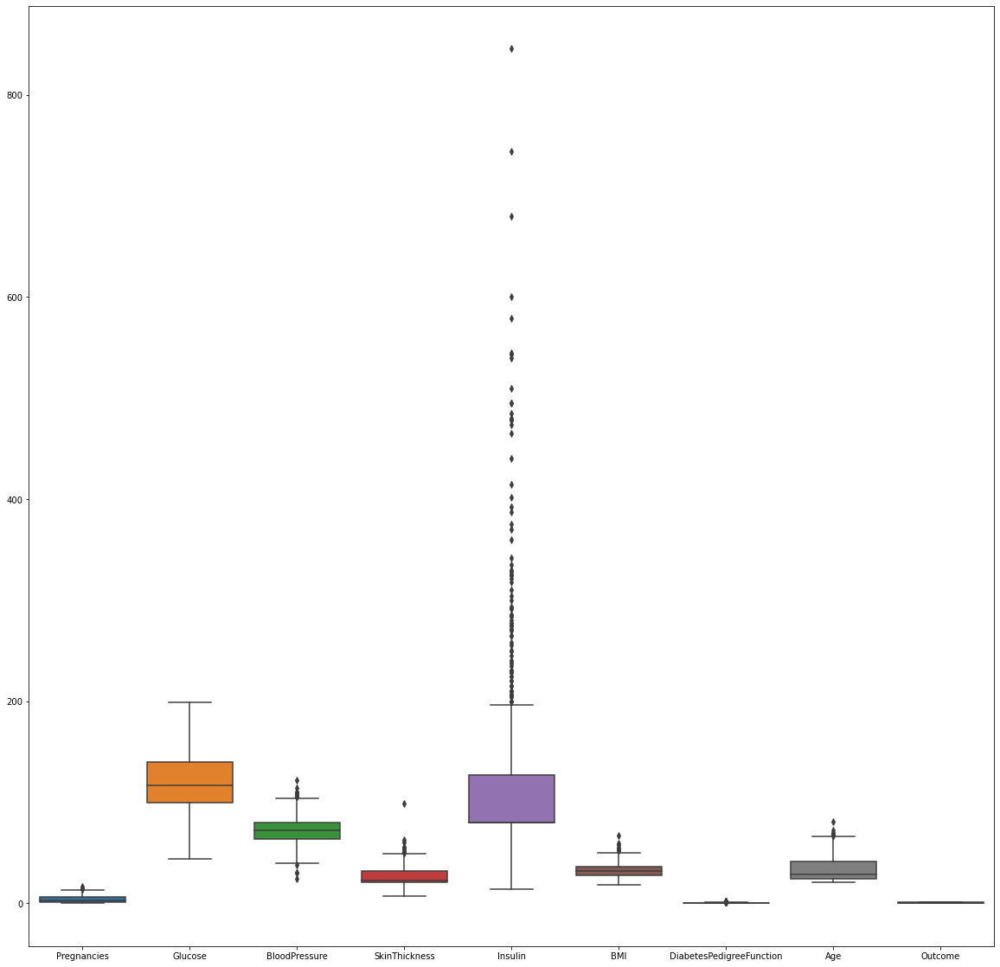

In [14]:
fig, ax = plt.subplots(figsize = (20,20))
sns.boxplot(data = df, ax = ax)

In [15]:
q = df['Insulin'].quantile(.70) # 70 is just a percentile we can take any percentile we wish

In [16]:
q

106.0

In [17]:
df['Insulin'] < q

0       True
1       True
2       True
3       True
4      False
       ...  
763    False
764     True
765    False
766     True
767     True
Name: Insulin, Length: 768, dtype: bool

In [18]:
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


In [19]:
df[df['Insulin'] < q]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
5,5,116.0,74.0,20.536458,79.799479,25.6,0.201,30,0
...,...,...,...,...,...,...,...,...,...
761,9,170.0,74.0,31.000000,79.799479,44.0,0.403,43,1
762,9,89.0,62.0,20.536458,79.799479,22.5,0.142,33,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


In [20]:
q = df['Insulin'].quantile(.80)
q

150.0

In [21]:
df[df['Insulin'] < q]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
5,5,116.0,74.0,20.536458,79.799479,25.6,0.201,30,0
...,...,...,...,...,...,...,...,...,...
762,9,89.0,62.0,20.536458,79.799479,22.5,0.142,33,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


In [22]:
q = df['Insulin'].quantile(.90)
q

210.0

In [23]:
df_new = df[df['Insulin'] < q]
df_new

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


In [24]:
# here im considering bloodpressure column
q = df['BloodPressure'].quantile(.70)

In [25]:
q

78.0

In [26]:
df[df['BloodPressure'] < q]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


<AxesSubplot:>

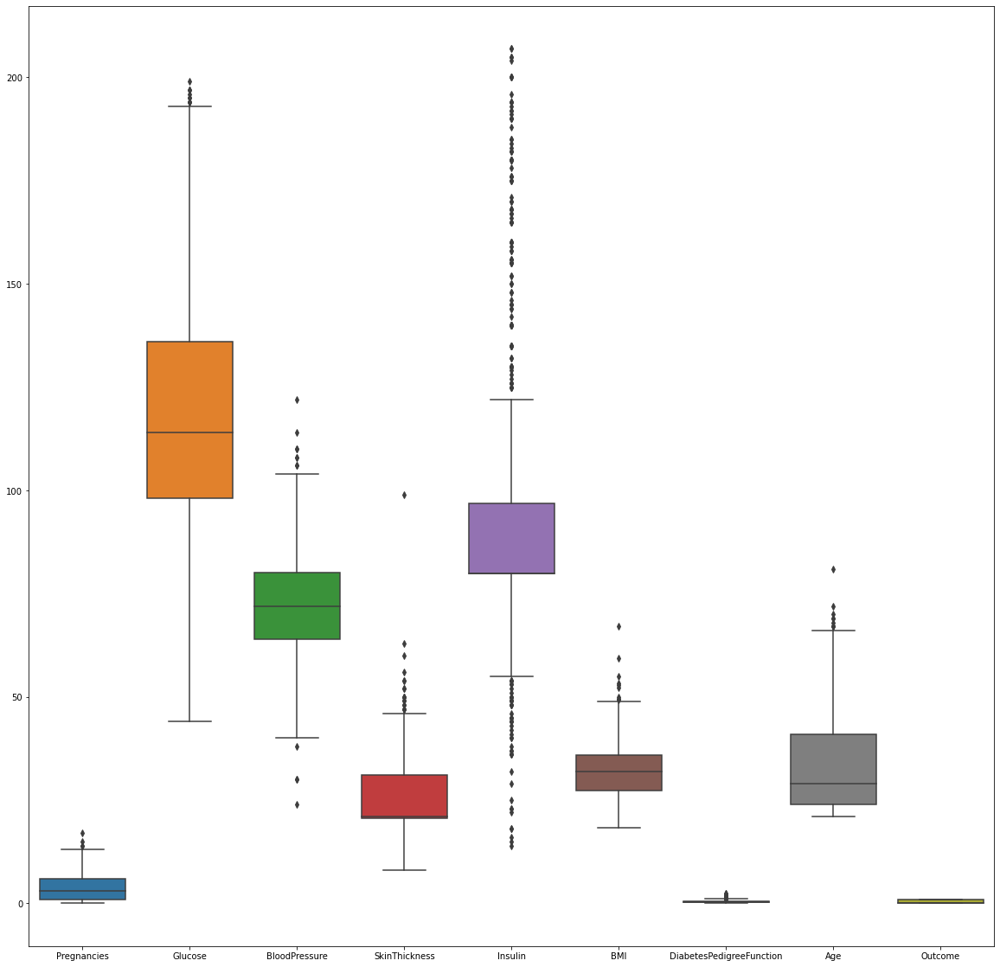

In [27]:
fig, ax = plt.subplots(figsize = (20,20))
sns.boxplot(data = df_new, ax = ax)

In [28]:
q = df['Pregnancies'].quantile(.98)
df_new = df[df['Pregnancies'] < q]

q = df['BMI'].quantile(.99)
df_new = df[df['BMI'] < q]

q = df['SkinThickness'].quantile(.99)
df_new = df[df['SkinThickness'] < q]

q = df['Insulin'].quantile(.95)
df_new = df[df['Insulin'] < q]

q = df['DiabetesPedigreeFunction'].quantile(.99)
df_new = df[df['DiabetesPedigreeFunction'] < q]

q = df['Age'].quantile(.99)
df_new = df[df['Age'] < q]

In [29]:
# quantile is not removed outlier effectively, hence we can go for other outlier eliminated techniques
# but here we are writing our own function to remove the outlier from the data

def outlier_removal(self,data):
    def outlier_limits(col):
        Q3, Q1 = np.nanpercentile(col,[75,25])
        IQR = Q3-Q1
        UL = Q3+1.5*IQR
        LL = Q1-1.5*IQR
        return UL, LL
    
    for column in data.columns:
        if data[column].dtype != 'int64':
            UL,LL = outlier_limits(data[column])
            data[column] = np.where((data[column] > UL) | (data[column] < LL), np.nan, data[column])
            
    return data        

In [30]:
df_new

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


<AxesSubplot:>

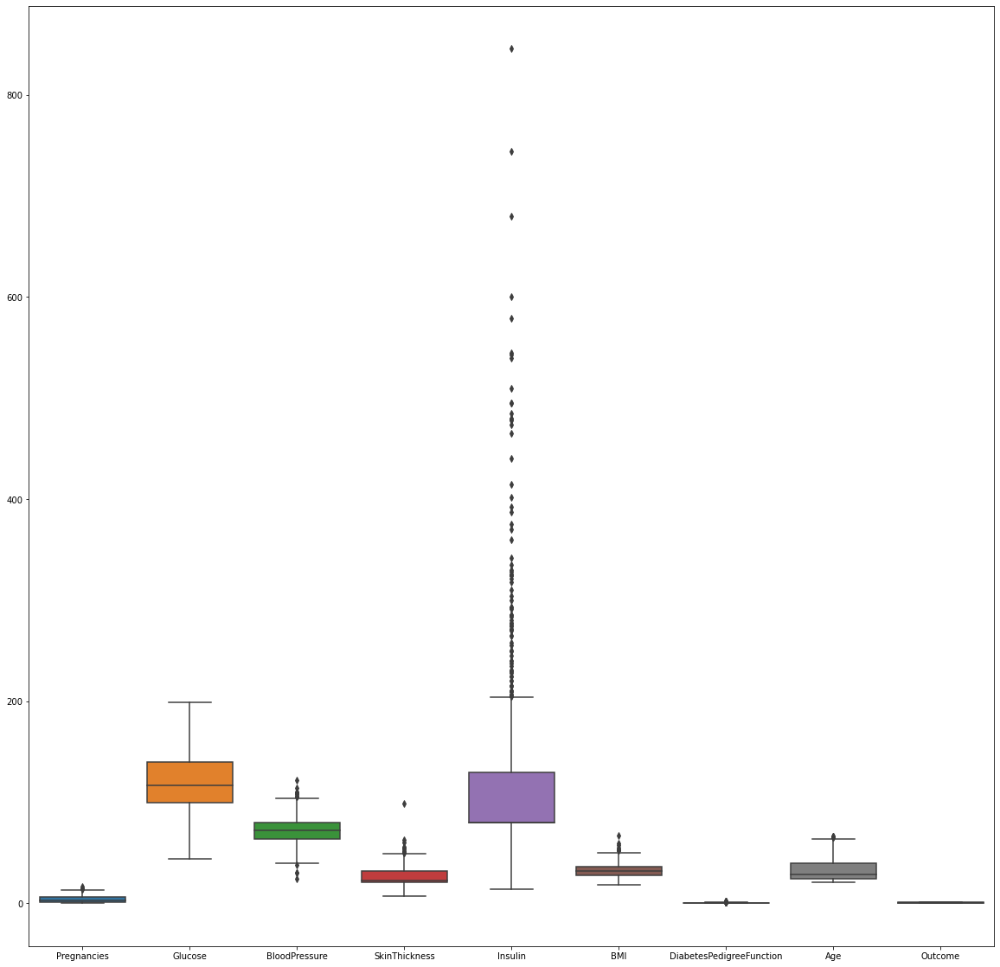

In [31]:
fig, ax = plt.subplots(figsize = (20, 20))
sns.boxplot(data = df_new, ax = ax)

<AxesSubplot:>

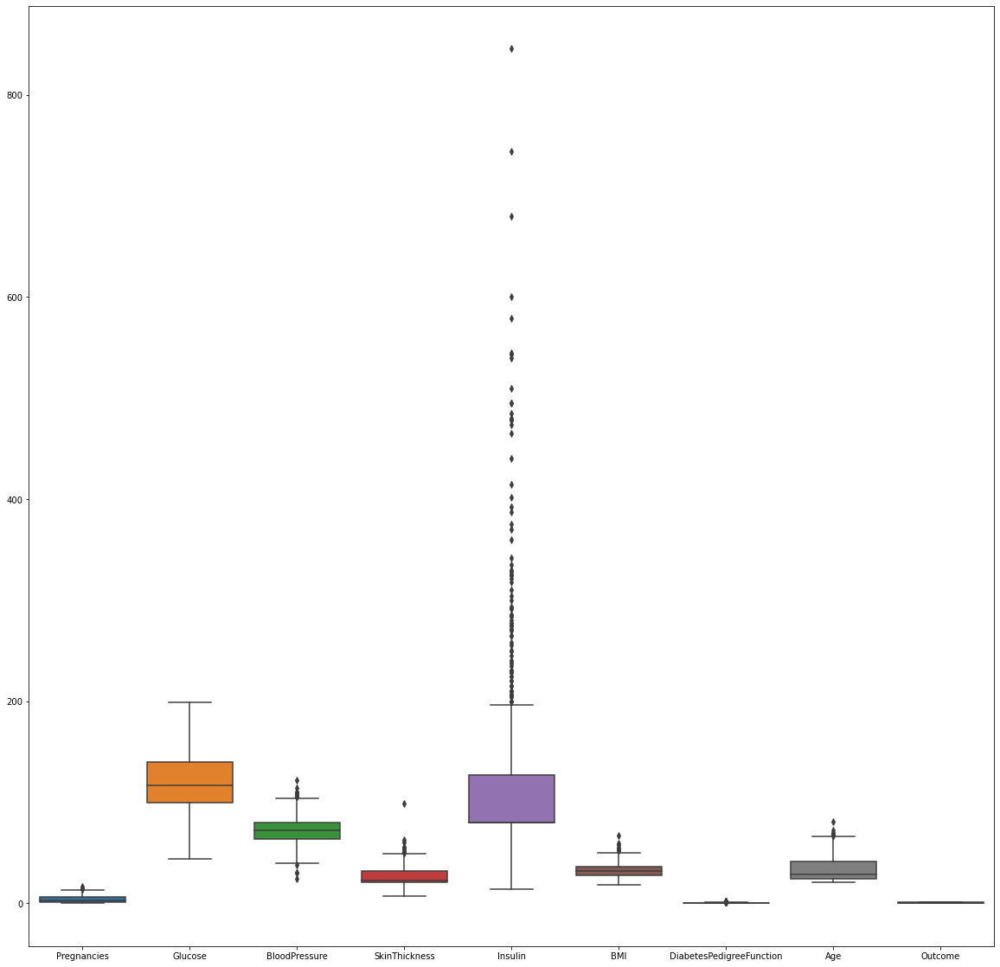

In [32]:
fig, ax = plt.subplots(figsize = (20, 20))
sns.boxplot(data = df, ax = ax)

In [33]:
ProfileReport(df_new)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [34]:
df_new

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


In [35]:
y = df_new['Outcome']
y

0      1
1      0
2      1
3      0
4      1
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 759, dtype: int64

In [36]:
x = df_new.drop(columns=['Outcome'])
x

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33
...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47


In [37]:
scalar = StandardScaler()

In [38]:
# fit_transform() gives in array/matrix form
# here we are getting the type of data which is present inside the array

scalar.fit_transform(x).dtype

dtype('float64')

In [39]:
pd.DataFrame(scalar.fit_transform(x))

,0,1,2,3,4,5,6,7
0,0.643271,0.870083,-0.016984,0.863130,-0.421014,0.160901,0.468793,1.548281
1,-0.839847,-1.206570,-0.510935,0.241772,-0.421014,-0.858162,-0.361774,-0.162527
2,1.236518,2.023779,-0.675585,-0.634708,-0.421014,-1.338578,0.604211,-0.072485
3,-0.839847,-1.074719,-0.510935,-0.379585,-0.269070,-0.639792,-0.915485,-1.062953
4,-1.136471,0.507493,-2.651386,0.863130,0.522721,1.543915,5.467240,0.017558
...,...,...,...,...,...,...,...,...
754,1.829765,-0.679166,0.312316,2.209403,0.651119,0.058994,-0.903448,2.718835
755,-0.543224,0.013052,-0.181634,0.034653,-0.421014,0.626758,-0.394876,-0.522698
756,0.346647,-0.019911,-0.016984,-0.379585,-0.076473,-0.916395,-0.680760,-0.252570
757,-0.839847,0.144903,-1.004885,-0.634708,-0.421014,-0.348631,-0.367793,1.278154


In [40]:
ProfileReport(pd.DataFrame(scalar.fit_transform(x)))

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [41]:
x_scaled = scalar.fit_transform(x)

In [42]:
df_new_scalar = pd.DataFrame(scalar.fit_transform(df_new))

<AxesSubplot:>

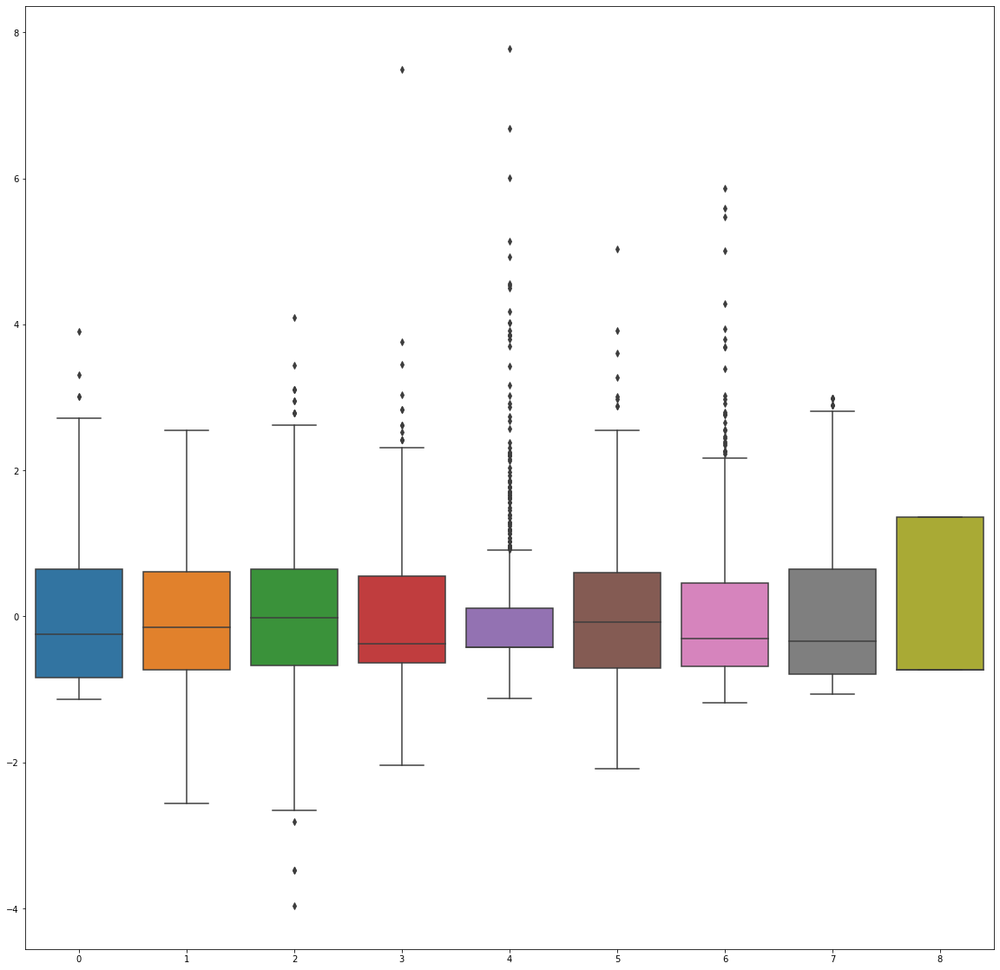

In [43]:
fig, ax = plt.subplots(figsize = (20, 20))
sns.boxplot(data = df_new_scalar, ax = ax)

In [44]:
x_scaled

array([[ 0.64327075,  0.87008298, -0.01698412, ...,  0.16090077,
         0.46879263,  1.54828125],
       [-0.83984741, -1.20656984, -0.51093456, ..., -0.85816238,
        -0.36177415, -0.16252742],
       [ 1.23651801,  2.02377899, -0.6755847 , ..., -1.33857787,
         0.60421113, -0.07248486],
       ...,
       [ 0.34664712, -0.01991109, -0.01698412, ..., -0.91639456,
        -0.68075995, -0.25256998],
       [-0.83984741,  0.14490263, -1.00488499, ..., -0.3486308 ,
        -0.36779275,  1.27815356],
       [-0.83984741, -0.9428679 , -0.18163427, ..., -0.30495667,
        -0.47010895, -0.88286791]])

In [45]:
y

0      1
1      0
2      1
3      0
4      1
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 759, dtype: int64

In [46]:
def vif_score(x):
    scaler = StandardScaler()
    arr = scaler.fit_transform(x)
    return pd.DataFrame([[x.columns[i], variance_inflation_factor(arr,i)] for i in range(arr.shape[1])], columns = ['FEATURE','VIF_SCORE'])

In [47]:
vif_score(x)

,FEATURE,VIF_SCORE
0,Pregnancies,1.484572
1,Glucose,1.354580
2,BloodPressure,1.247898
3,SkinThickness,1.455095
4,Insulin,1.264776
5,BMI,1.551161
6,DiabetesPedigreeFunction,1.058847
7,Age,1.680199


In [48]:
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y, test_size= .20, random_state= 144)

In [49]:
x_train

array([[-0.54322378, -0.31657578,  1.13556689, ...,  0.85968694,
        -0.67775065, -0.4326551 ],
       [-1.13647104, -0.44842675, -0.34628441, ..., -0.75625607,
         0.95028062, -0.07248486],
       [ 1.82976527,  0.01305165,  0.47696631, ..., -0.71258193,
         0.12272314,  1.09806844],
       ...,
       [ 0.64327075,  0.11193988, -0.34628441, ..., -0.36318885,
        -0.02172326, -0.07248486],
       [-0.83984741, -0.7121287 , -0.01698412, ..., -1.04741697,
         0.56208093, -0.4326551 ],
       [ 0.34664712,  2.22155545, -0.6755847 , ..., -0.18849231,
         0.33638343, -0.34261254]])

In [50]:
x_test

array([[-0.24660015, -0.34953852, -0.84023485, ..., -1.44048418,
        -0.99071784, -1.06295303],
       [-0.83984741, -0.02338763,  0.14766602, ..., -0.69802389,
        -0.51825775, -1.06295303],
       [-0.83984741, -1.10768161, -3.47463717, ...,  3.27632242,
         0.07457434, -0.61274022],
       ...,
       [-0.24660015,  0.2767536 , -0.6755847 , ..., -1.36769396,
        -0.47311825, -0.97291047],
       [ 1.82976527,  0.11193988, -0.18163427, ..., -0.20305035,
        -0.80113194,  0.7378982 ],
       [ 0.64327075, -0.08583658, -1.82813572, ..., -0.78537216,
         2.54821888,  0.01755771]])

In [51]:
x_test[0]

array([-0.24660015, -0.34953852, -0.84023485, -0.63470786, -0.42101423,
       -1.44048418, -0.99071784, -1.06295303])

In [52]:
log_reg = LogisticRegression()

In [53]:
log_reg.fit(x_train, y_train)

LogisticRegression()

In [54]:
# verbose will give the description of the model after fitting the data 
# any positive value we can give as value to the verbose
log_reg = LogisticRegression(verbose = 1)

In [55]:
log_reg.fit(x_train,y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


LogisticRegression(verbose=1)

In [56]:
# this is the single test value
x_test[0]

array([-0.24660015, -0.34953852, -0.84023485, -0.63470786, -0.42101423,
       -1.44048418, -0.99071784, -1.06295303])

In [57]:
# here we are going to do single value prediction
# here the output we are getting is probability of happening and probability of not happening
# index zero is probability of not happening or 0 and index one is probability of happening or 1 and default threshold is 0.5

# single value prediction
log_reg.predict_proba([x_test[0]])

array([[0.94265443, 0.05734557]])

In [58]:
0.94265443 + 0.05734557

1.0

In [59]:
log_reg.predict([x_test[0]])

array([0], dtype=int64)

In [60]:
log_reg.predict_proba([x_test[1]])

array([[0.88820608, 0.11179392]])

In [61]:
0.88820608 + 0.11179392

1.0

In [62]:
log_reg.predict([x_test[1]])

array([0], dtype=int64)

In [63]:
log_reg.predict_proba([x_test[8]])

array([[0.04650837, 0.95349163]])

In [64]:
0.04650837+ 0.95349163

1.0

In [65]:
log_reg.predict([x_test[8]])

array([1], dtype=int64)

In [66]:
# bulk prediction

y_pred = log_reg.predict(x_test)

In [67]:
y_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1,
       0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1,
       0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0],
      dtype=int64)

In [68]:
y_test

190    0
182    0
125    1
635    1
337    1
      ..
166    0
74     0
686    0
25     1
243    1
Name: Outcome, Length: 152, dtype: int64

In [69]:
np.array(y_test)

array([0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1,
       0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1,
       0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1,
       0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1],
      dtype=int64)

In [70]:
# for checking accuracy or for evaluating our model we are going to create confusion matrix
# for creating confusion matrix we can use our own code or scikit learn

confusion_matrix(y_test, y_pred)

array([[82, 12],
       [26, 32]], dtype=int64)

In [71]:
print(len(np.array(y_test)), len(y_pred))

152 152


In [72]:
# here we are calculating the sum of confusion matrix which is also equal to len of output
82+12+26+32

152

In [73]:
# .ravel function returns the values in array form

confusion_matrix(y_test,y_pred).ravel()

array([82, 12, 26, 32], dtype=int64)

In [74]:
# this is the order which followed by the scikit learn

tn, fp, fn, tp = confusion_matrix(y_test,y_pred).ravel()

In [75]:
# normally we follow(sunny follows) 
# tp,fn,fp,tn

tn, fp, fn, tp

(82, 12, 26, 32)

In [76]:
conf_matrx = confusion_matrix(y_test, y_pred)

In [77]:
conf_matrx

array([[82, 12],
       [26, 32]], dtype=int64)

In [78]:
true_negative = conf_matrx[0][0]
false_positive = conf_matrx[0][1]
false_negative = conf_matrx[1][0]
true_positive = conf_matrx[1][1]

In [79]:
# breaking down the formula for accuracy

Accuracy = (true_positive + true_negative) / (true_positive + true_negative + false_positive + false_negative)
Accuracy

0.75

In [80]:
# precision

Precision = true_positive / (true_positive + false_positive)
Precision

0.7272727272727273

In [81]:
# recall

Recall = true_positive / (true_positive + false_negative)
Recall

0.5517241379310345

In [82]:
# f1 score

F1_Score = 2 * (Recall * Precision) / (Recall + Precision)
F1_Score

0.6274509803921569

In [83]:
# here we are performing same with the help of scikit learn

accuracy_score(y_test, y_pred)

0.75

In [84]:
from sklearn.metrics import classification_report

In [85]:
classification_report(y_test, y_pred)

'              precision    recall  f1-score   support\n\n           0       0.76      0.87      0.81        94\n           1       0.73      0.55      0.63        58\n\n    accuracy                           0.75       152\n   macro avg       0.74      0.71      0.72       152\nweighted avg       0.75      0.75      0.74       152\n'

In [86]:
# Area under curve

auc = roc_auc_score(y_test, y_pred)
auc

0.7120322817314747

In [87]:
fpr, tpr, threshold = roc_curve(y_test, y_pred)

In [88]:
fpr

array([0.        , 0.12765957, 1.        ])

In [89]:
tpr

array([0.        , 0.55172414, 1.        ])

In [90]:
threshold

array([2, 1, 0], dtype=int64)

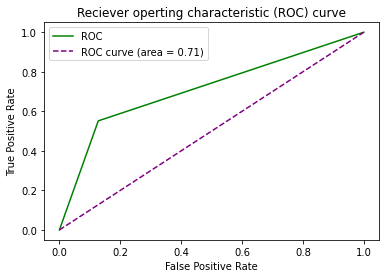

In [91]:
plt.plot(fpr, tpr, color = 'green', label = 'ROC')
plt.plot([0,1],[0,1],color = 'purple', linestyle = '--', label = 'ROC curve (area = %0.2f)' % auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Reciever operting characteristic (ROC) curve')
plt.legend()
plt.show()

In [92]:
from sklearn.metrics import multilabel_confusion_matrix

In [93]:
y_test1 = [0, 1, 0, 0, 1, 2]
y_pred1 = [1, 1, 0, 0, 1, 0]

In [94]:
# here in place of y_pred we have to give probability 
multilabel_confusion_matrix(y_test1, y_pred1)

array([[[2, 1],
        [1, 2]],

       [[3, 1],
        [0, 2]],

       [[5, 0],
        [1, 0]]], dtype=int64)

In [95]:
# predict probabilities

lr_probs = log_reg.predict_proba(x_test)

In [96]:
# here we are getting probability for happening and probability for not happening

lr_probs

array([[0.94265443, 0.05734557],
       [0.88820608, 0.11179392],
       [0.51812892, 0.48187108],
       [0.62348126, 0.37651874],
       [0.73884711, 0.26115289],
       [0.67051298, 0.32948702],
       [0.54049891, 0.45950109],
       [0.71156729, 0.28843271],
       [0.04650837, 0.95349163],
       [0.64337711, 0.35662289],
       [0.76673319, 0.23326681],
       [0.88195599, 0.11804401],
       [0.54665237, 0.45334763],
       [0.87940628, 0.12059372],
       [0.98364509, 0.01635491],
       [0.96024307, 0.03975693],
       [0.32775189, 0.67224811],
       [0.42724488, 0.57275512],
       [0.27724288, 0.72275712],
       [0.82849399, 0.17150601],
       [0.69537147, 0.30462853],
       [0.09441333, 0.90558667],
       [0.6962666 , 0.3037334 ],
       [0.83655983, 0.16344017],
       [0.71063199, 0.28936801],
       [0.40086514, 0.59913486],
       [0.65747766, 0.34252234],
       [0.64932061, 0.35067939],
       [0.80057456, 0.19942544],
       [0.94637186, 0.05362814],
       [0.

In [97]:
# here im giving probability out put(both chance of happening and not happening)
# here will get error(we have to give either happening or not happening)
fpr, tpr, threshold = roc_curve(y_test, lr_probs)   

ValueError: y should be a 1d array, got an array of shape (152, 2) instead.

In [100]:
# keep probabilities for the positive outcome only
# performing slicing operation
lr_probs = lr_probs[:,1]

In [101]:
lr_probs

array([0.05734557, 0.11179392, 0.48187108, 0.37651874, 0.26115289,
       0.32948702, 0.45950109, 0.28843271, 0.95349163, 0.35662289,
       0.23326681, 0.11804401, 0.45334763, 0.12059372, 0.01635491,
       0.03975693, 0.67224811, 0.57275512, 0.72275712, 0.17150601,
       0.30462853, 0.90558667, 0.3037334 , 0.16344017, 0.28936801,
       0.59913486, 0.34252234, 0.35067939, 0.19942544, 0.05362814,
       0.08957822, 0.68781025, 0.74817345, 0.9718217 , 0.10374644,
       0.90490805, 0.02601067, 0.62962232, 0.51693798, 0.67258802,
       0.29917452, 0.02643347, 0.17051305, 0.19072721, 0.0924123 ,
       0.27415057, 0.26761543, 0.35260557, 0.13052383, 0.90359133,
       0.22213833, 0.34878652, 0.90067978, 0.08445785, 0.72365996,
       0.35947243, 0.19148331, 0.67451755, 0.57578528, 0.04635768,
       0.61040877, 0.04508331, 0.37590294, 0.19623467, 0.40272151,
       0.52387946, 0.0676929 , 0.37151296, 0.29960063, 0.91562568,
       0.52009136, 0.03609169, 0.94976124, 0.08251667, 0.03325

In [102]:
fpr, tpr, threshold = roc_curve(y_test, lr_probs)

In [103]:
fpr

array([0.        , 0.        , 0.0212766 , 0.0212766 , 0.03191489,
       0.03191489, 0.05319149, 0.05319149, 0.07446809, 0.07446809,
       0.10638298, 0.10638298, 0.11702128, 0.11702128, 0.13829787,
       0.13829787, 0.17021277, 0.17021277, 0.19148936, 0.19148936,
       0.21276596, 0.21276596, 0.22340426, 0.22340426, 0.27659574,
       0.27659574, 0.28723404, 0.28723404, 0.30851064, 0.30851064,
       0.31914894, 0.31914894, 0.34042553, 0.34042553, 0.38297872,
       0.38297872, 0.40425532, 0.40425532, 0.42553191, 0.42553191,
       0.44680851, 0.44680851, 0.45744681, 0.45744681, 0.5       ,
       0.5       , 0.54255319, 0.54255319, 0.62765957, 0.62765957,
       1.        ])

In [104]:
tpr

array([0.        , 0.01724138, 0.01724138, 0.06896552, 0.06896552,
       0.34482759, 0.34482759, 0.36206897, 0.36206897, 0.48275862,
       0.48275862, 0.53448276, 0.53448276, 0.55172414, 0.55172414,
       0.60344828, 0.60344828, 0.63793103, 0.63793103, 0.67241379,
       0.67241379, 0.68965517, 0.68965517, 0.70689655, 0.70689655,
       0.72413793, 0.72413793, 0.74137931, 0.74137931, 0.77586207,
       0.77586207, 0.79310345, 0.79310345, 0.81034483, 0.81034483,
       0.84482759, 0.84482759, 0.86206897, 0.86206897, 0.89655172,
       0.89655172, 0.93103448, 0.93103448, 0.94827586, 0.94827586,
       0.96551724, 0.96551724, 0.98275862, 0.98275862, 1.        ,
       1.        ])

In [105]:
# these many thresholds are consider w.r.t data
threshold

array([1.97672413, 0.97672413, 0.97544379, 0.94976124, 0.94955707,
       0.72365996, 0.69697881, 0.69662264, 0.6843098 , 0.61040877,
       0.57578528, 0.52387946, 0.52009136, 0.51745232, 0.49082592,
       0.46531108, 0.45334763, 0.42508739, 0.40272151, 0.37651874,
       0.37590294, 0.37151296, 0.35947243, 0.35662289, 0.34672146,
       0.34252234, 0.34192047, 0.32948702, 0.30988692, 0.30462853,
       0.3037334 , 0.30189077, 0.29917452, 0.28936801, 0.26761543,
       0.26059404, 0.23624307, 0.23326681, 0.22213833, 0.20237398,
       0.19942544, 0.19148331, 0.19072721, 0.18601989, 0.16344017,
       0.15766383, 0.12969632, 0.12059372, 0.09603126, 0.0924123 ,
       0.01066271])

<function matplotlib.pyplot.legend(*args, **kwargs)>

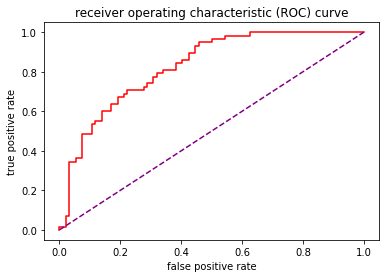

In [106]:
plt.plot(fpr, tpr, color = 'red', label = "ROC")
plt.plot([0,1], [0,1], color = 'purple', linestyle = '--', label = 'ROC curve(area=%0.2f)'% auc)
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.title('receiver operating characteristic (ROC) curve')
plt.legend

In [107]:
# hyper parameter tuning

# this will give you the default parameters which is having along with the model
log_reg.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 1,
 'warm_start': False}

In [108]:
log_reg.get_params().keys()

dict_keys(['C', 'class_weight', 'dual', 'fit_intercept', 'intercept_scaling', 'l1_ratio', 'max_iter', 'multi_class', 'n_jobs', 'penalty', 'random_state', 'solver', 'tol', 'verbose', 'warm_start'])

In [109]:
param_grid = {'penalty': ['l1','l2', 'elasticnet'],
              'C' : np.logspace(-4, 4, 20),
              'solver' : ['linlinear', 'lbfgs', 'liblinear', 'sag', 'saga']}

In [110]:
from sklearn.model_selection import GridSearchCV

In [111]:
# instantiating the gridsearchcv object

log_reg_gscv = GridSearchCV(estimator = log_reg, param_grid = param_grid, cv = 5, n_jobs = -1, verbose = 1)

In [112]:
x_train

array([[-0.54322378, -0.31657578,  1.13556689, ...,  0.85968694,
        -0.67775065, -0.4326551 ],
       [-1.13647104, -0.44842675, -0.34628441, ..., -0.75625607,
         0.95028062, -0.07248486],
       [ 1.82976527,  0.01305165,  0.47696631, ..., -0.71258193,
         0.12272314,  1.09806844],
       ...,
       [ 0.64327075,  0.11193988, -0.34628441, ..., -0.36318885,
        -0.02172326, -0.07248486],
       [-0.83984741, -0.7121287 , -0.01698412, ..., -1.04741697,
         0.56208093, -0.4326551 ],
       [ 0.34664712,  2.22155545, -0.6755847 , ..., -0.18849231,
         0.33638343, -0.34261254]])

In [113]:
y_train

620    0
202    0
34     0
433    0
503    0
      ..
649    0
424    1
217    0
446    0
360    1
Name: Outcome, Length: 607, dtype: int64

In [114]:
print(len(x_train))
print(len(y_train))

607
607


In [115]:
# fitting data to GridSearchCV object

log_reg_gscv.fit(x_train, y_train)

Fitting 5 folds for each of 300 candidates, totalling 1500 fits
[LibLinear]

C:\Users\KARISHMA\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
900 fits failed out of a total of 1500.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
300 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\KARISHMA\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\KARISHMA\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1461, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "C:\Users\KARISHMA\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 434, in _check_solver
    raise 

GridSearchCV(cv=5, estimator=LogisticRegression(verbose=1), n_jobs=-1,
             param_grid={'C': array([1.00000000e-04, 2.63665090e-04, 6.95192796e-04, 1.83298071e-03,
       4.83293024e-03, 1.27427499e-02, 3.35981829e-02, 8.85866790e-02,
       2.33572147e-01, 6.15848211e-01, 1.62377674e+00, 4.28133240e+00,
       1.12883789e+01, 2.97635144e+01, 7.84759970e+01, 2.06913808e+02,
       5.45559478e+02, 1.43844989e+03, 3.79269019e+03, 1.00000000e+04]),
                         'penalty': ['l1', 'l2', 'elasticnet'],
                         'solver': ['linlinear', 'lbfgs', 'liblinear', 'sag',
                                    'saga']},
             verbose=1)

In [116]:
log_reg_gscv.best_params_

{'C': 0.08858667904100823, 'penalty': 'l1', 'solver': 'liblinear'}

In [117]:
log_reg = LogisticRegression(C= 0.08858667904100823, penalty= 'l1', solver= 'liblinear', verbose = 1)

In [118]:
log_reg.fit(x_train, y_train)

[LibLinear]

LogisticRegression(C=0.08858667904100823, penalty='l1', solver='liblinear',
                   verbose=1)

In [119]:
y_p = log_reg.predict(x_test)

In [120]:
accuracy_score(y_test, y_p)

0.743421052631579

In [121]:
from sklearn.model_selection import RandomizedSearchCV

In [122]:
import warnings
warnings.filterwarnings('ignore')

In [123]:
# instantiating the RandomizedSearchCV object

log_reg_rscv = RandomizedSearchCV(log_reg, param_grid, cv = 5)

In [124]:
# fitting data to RandomizedSearchCV

log_reg_rscv.fit(x_train, y_train)

[LibLinear][LibLinear][LibLinear][LibLinear][LibLinear]

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

convergence after 23 epochs took 0 seconds
convergence after 26 epochs took 0 seconds
convergence after 26 epochs took 0 seconds
convergence after 24 epochs took 0 seconds
convergence after 24 epochs took 0 seconds
[LibLinear]

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


RandomizedSearchCV(cv=5,
                   estimator=LogisticRegression(C=0.08858667904100823,
                                                penalty='l1',
                                                solver='liblinear', verbose=1),
                   param_distributions={'C': array([1.00000000e-04, 2.63665090e-04, 6.95192796e-04, 1.83298071e-03,
       4.83293024e-03, 1.27427499e-02, 3.35981829e-02, 8.85866790e-02,
       2.33572147e-01, 6.15848211e-01, 1.62377674e+00, 4.28133240e+00,
       1.12883789e+01, 2.97635144e+01, 7.84759970e+01, 2.06913808e+02,
       5.45559478e+02, 1.43844989e+03, 3.79269019e+03, 1.00000000e+04]),
                                        'penalty': ['l1', 'l2', 'elasticnet'],
                                        'solver': ['linlinear', 'lbfgs',
                                                   'liblinear', 'sag',
                                                   'saga']})

In [125]:
log_reg_rscv.best_params_

{'solver': 'liblinear', 'penalty': 'l1', 'C': 11.288378916846883}

In [126]:
log_reg_rs = LogisticRegression(solver = 'liblinear', penalty = 'l2', C = 29.763514416313132, verbose = 1)

In [127]:
log_reg_rs.fit(x_train, y_train)

[LibLinear]

LogisticRegression(C=29.763514416313132, solver='liblinear', verbose=1)

In [128]:
y_p1 = log_reg_rs.predict(x_test)

In [129]:
accuracy_score(y_test, y_p1)

0.75